Experiment with spiral shape galaxy data synthesis

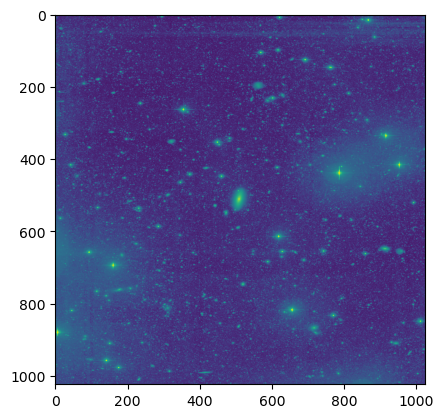

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import glob 
import os

# Load the .npy file
file_name = "../datasets/matlas_images_and_annotations/images/name=IC0598.npy"
data = np.load(file_name)

# Display the data
plt.imshow(data[0,:,:])
plt.show()

In [16]:
file_name = "../datasets/matlas_images_and_annotations/annotations/double/basichalosnocompanions/name=IC0598-class=Diffuse halo.npz"
data = np.load(file_name)
data.files
data['shape']
data['mask'].size

FileNotFoundError: [Errno 2] No such file or directory: '../datasets/matlas_images_and_annotations/annotations/double/basichalosnocompanions/name=IC0598-class=Diffuse halo.npz'

In [38]:
file_path = "../datasets/matlas_images_and_annotations/"
annotation_file_path = file_path + "annotations/standard/double/basichalosnocompanions_mergetidal/"

structure_name = {}
mask_files_name = {}

structure_name["Elongated tidal structures"] = "Elongated tidal structures"
mask_files_name["Elongated tidal structures"] = glob.glob(annotation_file_path + "*" + structure_name["Elongated tidal structures"] + ".npz")

# get the label file that has tidal structures then link to npy file
structure_files_name = ["=".join(structure_file.split("/")[-1].split('=')[:2])[:-6] + ".npy" for structure_file in mask_files_name["Elongated tidal structures"]]

structure_name["Diffuse halo"] = "Diffuse halo"
mask_files_name["Diffuse halo"] = [annotation_file_path + "=".join(structure_file.split("/")[-1].split('=')[:2] + [structure_name["Diffuse halo"]]) + ".npz" for structure_file in mask_files_name["Elongated tidal structures"]]

structure_name["Galaxy"] = "Galaxy"
mask_files_name["Galaxy"] = [annotation_file_path + "=".join(structure_file.split("/")[-1].split('=')[:2] + [structure_name["Galaxy"]]) + ".npz" for structure_file in mask_files_name["Elongated tidal structures"]]

structure_name["Elongated plus Galaxy"] = "Elongated plus Galaxy"
mask_files_name["Elongated plus Galaxy"] = glob.glob(annotation_file_path + "*" + structure_name["Elongated plus Galaxy"] + ".npz")


mask_files_name
# data = np.load(file_path + "images/" + structure_files_name[20])

# # Display the data
# plt.imshow(data[0,:,:])
# plt.show()

{'Elongated tidal structures': ['../datasets/matlas_images_and_annotations/annotations/standard/double/basichalosnocompanions_mergetidal/name=NGC1222-class=Elongated tidal structures.npz',
  '../datasets/matlas_images_and_annotations/annotations/standard/double/basichalosnocompanions_mergetidal/name=NGC5480-class=Elongated tidal structures.npz',
  '../datasets/matlas_images_and_annotations/annotations/standard/double/basichalosnocompanions_mergetidal/name=NGC3445-class=Elongated tidal structures.npz',
  '../datasets/matlas_images_and_annotations/annotations/standard/double/basichalosnocompanions_mergetidal/name=NGC3227-class=Elongated tidal structures.npz',
  '../datasets/matlas_images_and_annotations/annotations/standard/double/basichalosnocompanions_mergetidal/name=NGC1253-class=Elongated tidal structures.npz',
  '../datasets/matlas_images_and_annotations/annotations/standard/double/basichalosnocompanions_mergetidal/name=NGC3226-class=Elongated tidal structures.npz',
  '../datasets/m

In [39]:
from scipy import ndimage

def decode_np_mask(array):
    shape, mask, centre = array['shape'], array['mask'], array['centre']
    mask = np.unpackbits(mask)
    mask = mask[:np.prod(shape)]
    
    return mask.reshape(shape), centre

def getMask(mask_files_name, mask_files_name2=None):
    mask_path = mask_files_name
    mask_path2 = mask_files_name2
    # try:
    if mask_files_name2 == None:
        mask = decode_np_mask(np.load(mask_path, allow_pickle=True))[0]
        mask = mask[np.count_nonzero(mask, axis=(1, 2)) > 0]
        return mask
    
    else:
        mask1 = decode_np_mask(np.load(mask_path, allow_pickle=True))[0]
        mask2 = decode_np_mask(np.load(mask_path2, allow_pickle=True))[0]
        cm1 = [ndimage.center_of_mass(mask) for mask in mask1]
        cm2 = [ndimage.center_of_mass(mask) for mask in mask2]
        
        for i, cm in enumerate(cm2): 
            min_idx = np.argmin(np.linalg.norm(np.array(cm1) - cm, axis=1))

            mask = mask1
            mask[min_idx] = np.logical_or(mask1[min_idx], mask2[i])
        
        mask = mask[np.count_nonzero(mask, axis=(1, 2)) > 0]
        return mask
    
def encode_np_mask(mask, file_name):
    shape = mask.shape
    mask = np.packbits(mask)
    np.savez(file_name, shape=shape, mask=mask, centre=None)

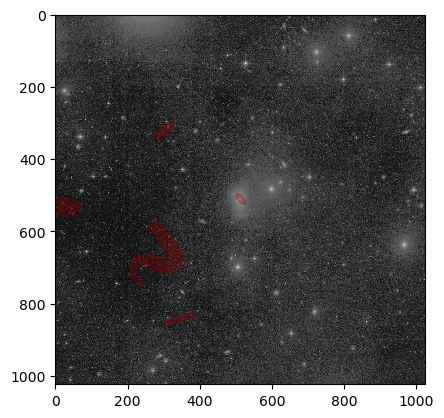

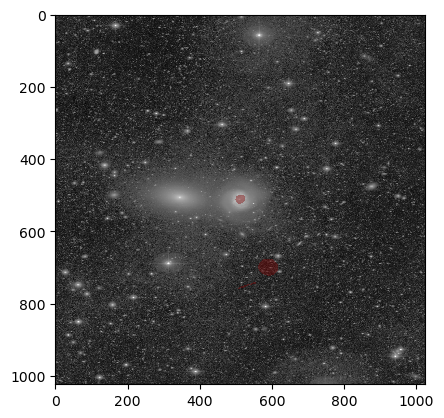

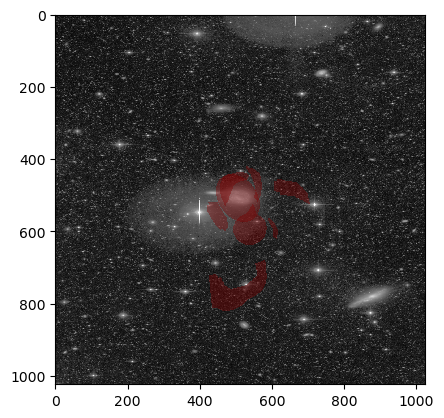

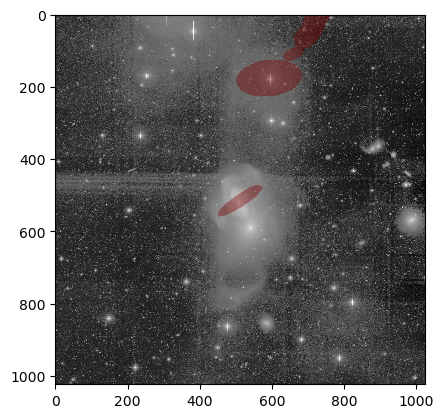

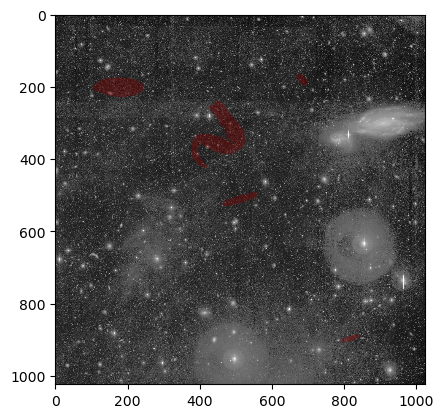

...

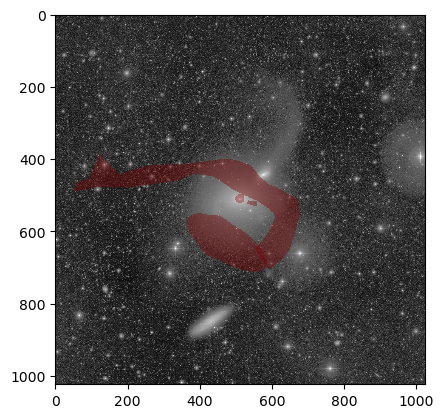

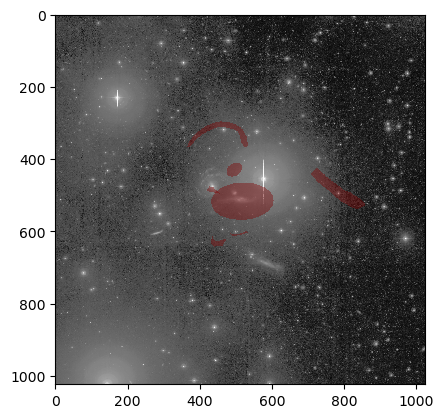

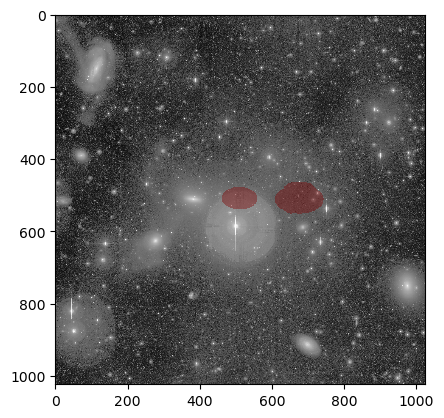

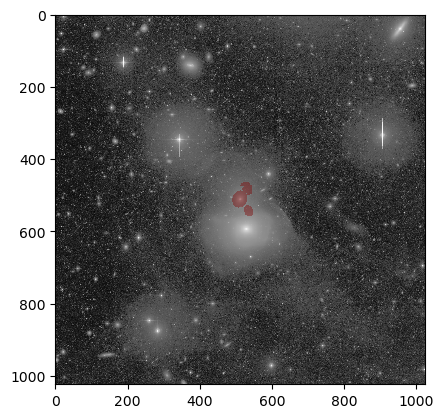

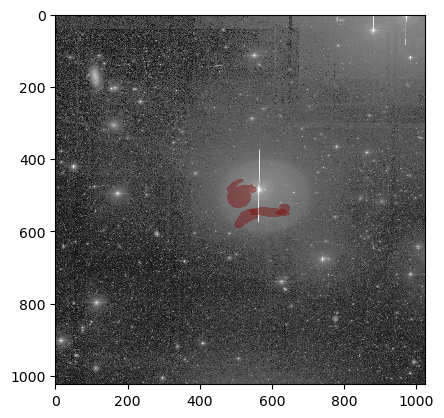

In [40]:
import random
COLOR_LIST = ['Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'winter', 'winter_r']

for idx in range(len(mask_files_name["Elongated tidal structures"])):
# idx = 3
# if idx != None:
    data = np.load(file_path + "images/" + structure_files_name[idx])

    plt.figure()

    data = np.load(file_path + "images/" + structure_files_name[idx])
    plt.imshow(data[0,:,:], "gray" , interpolation='none')

    masks = {}

    masks["Elongated plus Galaxy"] = getMask(mask_files_name["Elongated plus Galaxy"][idx])

    for i in range(masks["Elongated plus Galaxy"].shape[0]):
        plt.imshow(masks["Elongated plus Galaxy"][i,:,:], 'jet', interpolation='none', alpha=0.4*(masks["Elongated plus Galaxy"][i,:,:]>0))


    # masks["Elongated tidal structures"] = getMask(mask_files_name["Elongated tidal structures"][idx])
    # for i in range(masks["Elongated tidal structures"].shape[0]):
    #     plt.imshow(masks["Elongated tidal structures"][i,:,:], 'jet', interpolation='none', alpha=0.4*(masks["Elongated tidal structures"][i,:,:]>0))

    # masks["Galaxy"] = getMask(mask_files_name["Galaxy"][idx])
    # for i in range(masks["Galaxy"].shape[0]):
    #     plt.imshow(masks["Galaxy"][i,:,:], 'jet_r', interpolation='none', alpha=0.4*(masks["Galaxy"][i,:,:]>0))

    # print(mask_files_name["Elongated tidal structures"][idx])

    # masks["Elongated plus Galaxy"] = getMask(mask_files_name["Galaxy"][idx], mask_files_name["Elongated tidal structures"][idx])
    # color_list = random.sample(COLOR_LIST, masks["Elongated plus Galaxy"].shape[0])
    # for i in range(masks["Elongated plus Galaxy"].shape[0]):
    #     plt.imshow(masks["Elongated plus Galaxy"][i,:,:], color_list[i], interpolation='none', alpha=0.4*(masks["Elongated plus Galaxy"][i,:,:]>0))
    
    # encode_np_mask(masks["Elongated plus Galaxy"], mask_files_name["Elongated tidal structures"][idx].replace("Elongated tidal structures", "Elongated plus Galaxy"))

    # masks["Diffuse halo"] = getMask(mask_files_name["Diffuse halo"][idx])
    # for i in range(masks["Diffuse halo"].shape[0]):
    #     plt.imshow(masks["Diffuse halo"][i,:,:], 'Greens', interpolation='none', alpha=0.4*(masks["Diffuse halo"][i,:,:]>0))

    plt.show()

In [299]:
# k = np.load("/home/worachit/panoptic-lsb/datasets/matlas_images_and_annotations/annotations/standard/double/basiccirrusnocompanions/name=NGC3227-class=Galaxy.npz", allow_pickle=True)
k = np.load("/home/worachit/panoptic-lsb/intern_files/test.npz", allow_pickle=True)
print(k["mask"].shape)
# mask = np.unpackbits(k["mask"])
# print(mask.shape)
# mask = mask.reshape((2,1024,1024))
# mask_p = np.packbits(mask)
# print(mask_p.shape)
# mask_up = np.unpackbits(mask_p)
# print(mask_up.shape)
# mask_up = mask_up.reshape((2,1024,1024))

# mask_up.shape

# k["shape"]
# getMask("/home/worachit/panoptic-lsb/intern_files/test.npz")

(262144,)


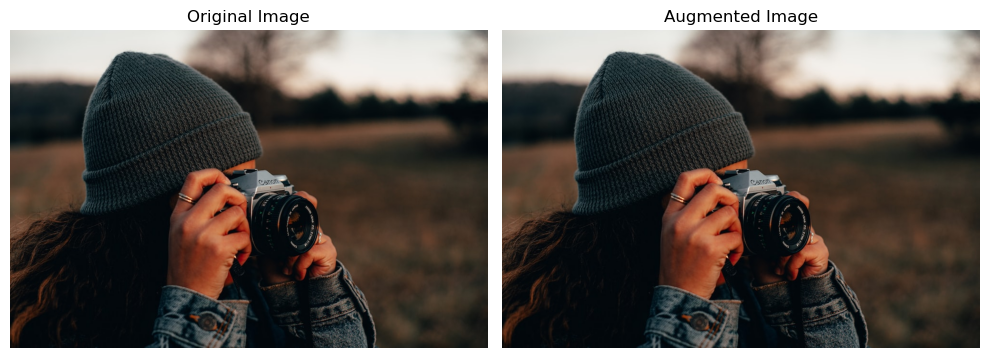

In [209]:
import albumentations as A
import cv2
import matplotlib.pyplot as plt

# Load an image
image = cv2.imread('sample.jpeg')

# Define the Rotate augmentation with a rotation range of -45 to 45 degrees
augmentation = A.Rotate(limit=(-90, 90), p=1)
augmentation = A.RandomRotate90()

# Apply the augmentation to the image
augmented_image = augmentation(image=image)['image']

# Visualize the original and augmented images
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axs[0].set_title('Original Image')
axs[0].axis('off')
axs[1].imshow(cv2.cvtColor(augmented_image, cv2.COLOR_BGR2RGB))
axs[1].set_title('Augmented Image')
axs[1].axis('off')

plt.tight_layout()
plt.show()